<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Oliver Proudfoot
    Math 321
    12.03.19

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [88]:
from matplotlib import pyplot as plt
import numpy as np
import IPython
from scipy.fftpack import fft,ifft, fft2, ifft2
import math
import scipy.signal as signal
import imageio
from scipy.io import wavfile

In [64]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [116]:
X = lambda x = 0,y=1,N=100: np.linspace(x,y,N)

class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        #initialize attributes
        self.rate = rate
        self.samples = samples
        
    # Problems 1.1 and 1.7
    def plot(self,trans = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        #plot the signal
        plt.plot(X(0,len(self.samples)/self.rate,len(self.samples)),self.samples,lw=.3)
        plt.ylim(-32768,32767)
        plt.ylabel("Magnitude")
        plt.xlabel("Time (s)")
        plt.title("Signal Plot")
        plt.show()
        
        #if desired, plot the FFT of the Signal
        if trans:
            plt.title("FFT of Signal")
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.plot(np.arange(len(self.samples)//2)*self.rate/len(self.samples),np.abs(fft(self.samples))[:len(self.samples)//2])
            plt.show()
        
    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        #Scale the signal for output
        if len(self.samples.shape)>1:
            ex_sample = np.int16(np.real(self.samples)/max(np.abs(np.real(self.samples[:,1])))*32767)
        elif force or self.samples.dtype == 'int16':
            ex_sample = np.int16(np.real(self.samples)/max(np.abs(np.real(self.samples)))*32767)
        #Else, nothing
        else:
            ex_sample = self.samples
            
        #export the file
        wavfile.write(filename, self.rate, ex_sample)    
    
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        #Catch invalid add
        if len(self.samples) != len(other.samples):
            raise ValueError("Samples to be added must be of same size")
        #return addition
        return SoundWave(self.rate,self.samples + other.samples)
        
    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #Catch invalid concatenate
        if self.rate != other.rate:
            raise ValueError("Sample rate must be equal for A >> B")
        #return concatenation
        return SoundWave(self.rate,np.append(self.samples,other.samples))
        
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
            
        #initialize dummy soundwave objects and get lengths of self and other
        self_temp = self
        other_temp = other
        s = len(self.samples)
        o = len(other.samples)
        
        #check sample rate error
        if self_temp.rate != other_temp.rate:
            raise ValueError("Wav files must have same sample rate")
        
        #if num of samples is not equal, pad with 0's
        if s != o:
            s1 = max(o,s)-s
            o1 = max(o,s)-o
            if s1 > 0: self_temp.samples = np.concatenate((self_temp.samples,np.zeros(int(s1))))
            if o1 > 0: other_temp.samples = np.concatenate((other_temp.samples,np.zeros(int(o1))))
                
        #compute convolution with fft.
        return SoundWave(self_temp.rate,ifft(fft(self_temp.samples)*fft(other_temp.samples)))
        
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #initialize dummy SoundWaves
        s = self
        o = other
        
        #check for sample rate error
        if s.rate != o.rate:
            raise ValueError("Wav files must have same sample rate")
            
        #initialize m,n,N for fast fourier transform
        n = len(s.samples)
        m = len(o.samples)
        N = 2**math.ceil(math.log(m+n-1)/math.log(2))
        
        #pad samples with 0 so they have length N
        s.samples = np.concatenate((self.samples,np.zeros(N-n)))
        o.samples = np.concatenate((other.samples,np.zeros(N-m)))
        
        #Compute convolution and take only the first m+n-1 terms
        return SoundWave(s.rate,(s * o).samples[:m+n])
        
        
    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #calculate the fft of the signal
        C = fft(self.samples)
        
        #set all fourier coefficients in the frequency range to 0
        for j in range(int(low_freq*len(self.samples)/self.rate), int(high_freq*len(self.samples)/self.rate)):
            C[j] = 0
            C[-j] = 0
        #return the retrieved soundwave from the filtered fft with ifft.
        return SoundWave(self.rate,np.real(ifft(C)))
    
#helper functions to import wav file into AudioWave object

def imprt(filename):
    r,s = wavfile.read(filename)
    return SoundWave(r,s)

def imprt_channel(filename):
    r,s = wavfile.read(filename)
    for i in range(s.shape[1]):
        yield SoundWave(r,s[:,i])


### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

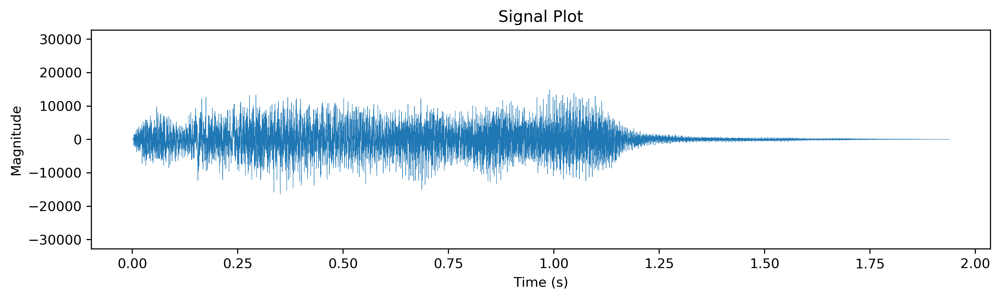

In [90]:
#extract data from file
r,samples = wavfile.read('tada.wav')
#create SoundWave Object
hello = SoundWave(r,samples)
#plot Object
hello.plot()
IPython.display.Audio(filename='tada.wav')

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [91]:
IPython.display.Audio(filename='tada.wav')

In [92]:
hello.export("PROB 2i.wav")
IPython.display.Audio(filename='PROB 2i.wav')

In [93]:
hello.export("PROB 2ii.wav", True)
IPython.display.Audio(filename='PROB 2ii.wav')

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [94]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    #create and return the samples as a soundwave object
    x = X(0,duration,duration*44100)
    samples = np.sin(x*np.pi*2*frequency)
    return SoundWave(44100, samples)
    

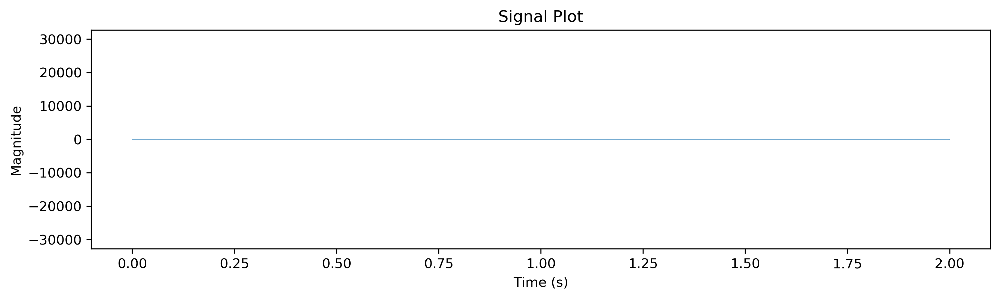

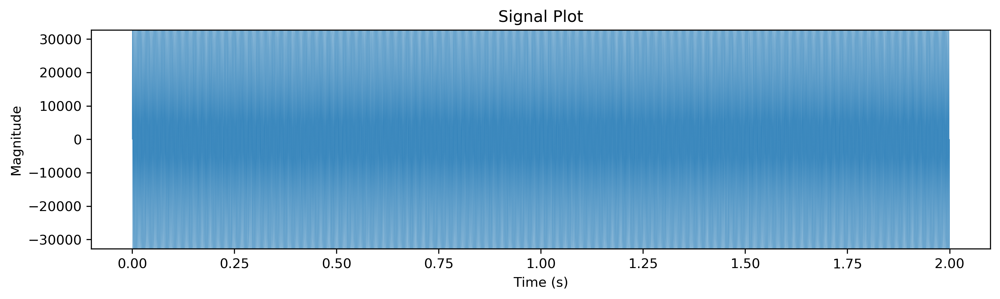

In [71]:
#Create, plot and export the note A
A = generate_note(440,2)
A.plot()
A.export("A_NOTE.wav",True)

#import the scaled note, make into soundwave obj. and plot
r,samples = wavfile.read('A_NOTE.wav')
A1 = SoundWave(r,samples)
A1.plot()
IPython.display.Audio(filename='A_NOTE.wav')

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

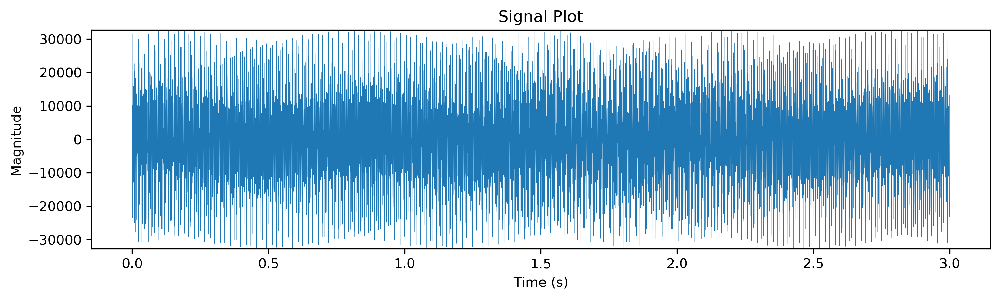

In [72]:
#CREATE NOTES, ADD THEM AND DISPLAY THEM
A = generate_note(440,3)
C = generate_note(523.25,3)
E = generate_note(659.25,3)
A_minor = A+C+E
A_minor.export("Amin_NOTE.wav", True)
r,samples = wavfile.read('Amin_NOTE.wav')
A_minor1 = SoundWave(r,samples)
A_minor1.plot()
IPython.display.Audio(filename='Amin_NOTE.wav')


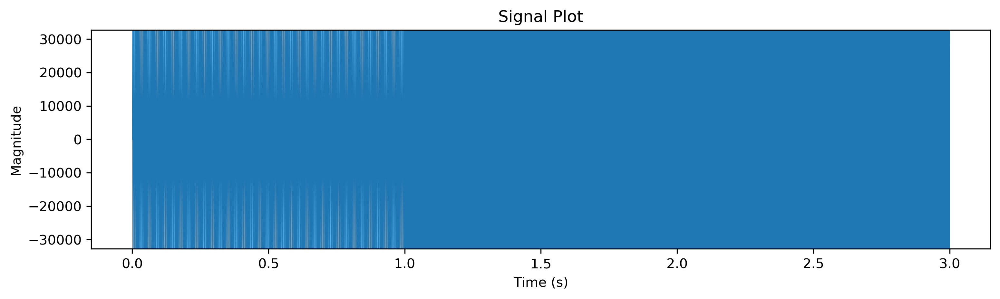

In [73]:
#CREATE NOTES, CONCATENATE THEM AND DISPLAY THEM
A = generate_note(440,1)
C = generate_note(523.25,1)
E = generate_note(659.25,1)
arpeggio = A >> C >> E
arpeggio.export("arpeggio_NOTE.wav",True)
r,samples = wavfile.read('arpeggio_NOTE.wav')
arpeggio1 = SoundWave(r,samples)
arpeggio1.plot()
IPython.display.Audio(filename='arpeggio_NOTE.wav')

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [74]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #Initialize n
    n = len(samples)
    #Initialize the formulas
    omega = lambda n,k: np.exp(2*np.pi*1j/n)**k
    w = lambda n,k: [omega(n,i*-k) for i in range(n)]
    #return the DFT
    return n*np.array([w(n,j) for j in range(n)])/len(samples)@samples


In [75]:
#Check simple_dft with builtin dft
x = np.random.rand(2**7)
np.allclose(simple_dft(x),fft(x))

True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [76]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    #Recursive Function
    def split(f):
        #initialize
        n = len(f)
        
        #if recursed enough, use simple DFT
        if n<=threshold:
            return n*simple_dft(f) 
        
        #else, split samples and recurse deeper
        else:
            even = split(f[::2])
            odd = split(f[1::2])     
            z = np.array([np.exp(2*np.pi*1j*k/n) for k in range(n)])
            m = n // 2 
        x = np.concatenate((even + z[:m]*odd, even + z[m:]*odd))
        return x
    return np.conj(split(samples)/len(samples))

In [77]:
#test speed of simple_fft vs builtin fft on 2**13 samples
x = np.random.rand(2**13)
print("\nsimple_fft() Time:")
%time custom = simple_fft(x)
print("\nscipy.fftpack.fft() Time:")
%time optimum = fft(x)

#Check they give the same result
print('\n',np.allclose(custom*(2**13),optimum))


simple_fft() Time:
CPU times: user 583 ms, sys: 17.9 ms, total: 601 ms
Wall time: 839 ms

scipy.fftpack.fft() Time:
CPU times: user 172 µs, sys: 4 µs, total: 176 µs
Wall time: 181 µs

 True


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

^^^see prob 4 above

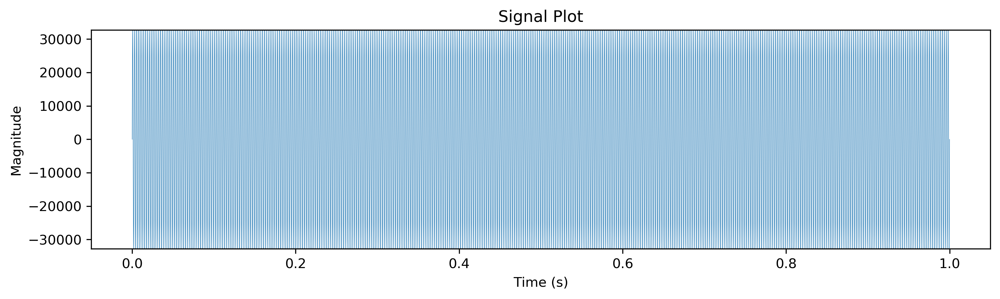

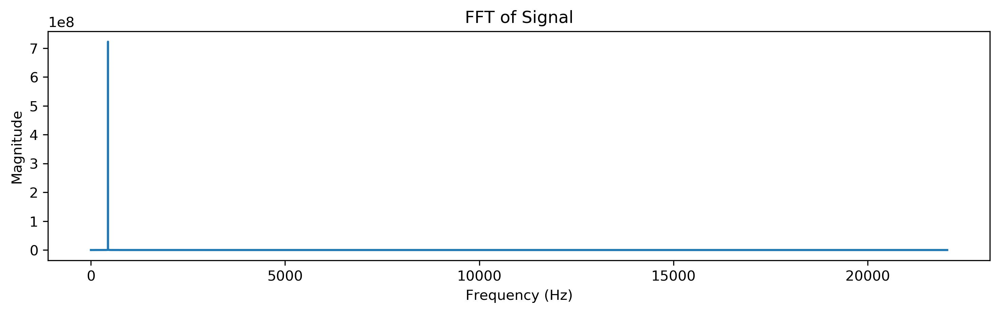

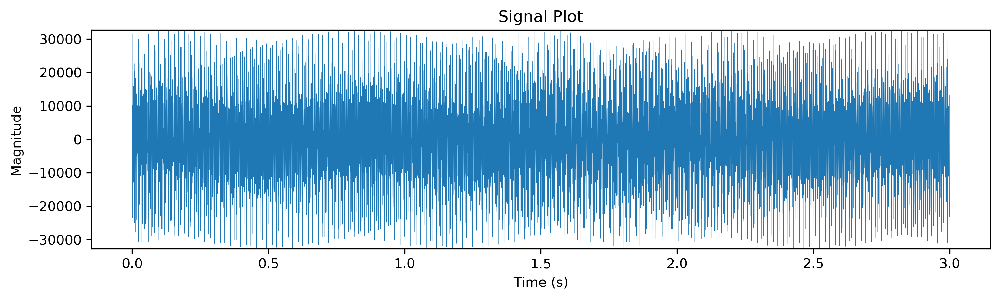

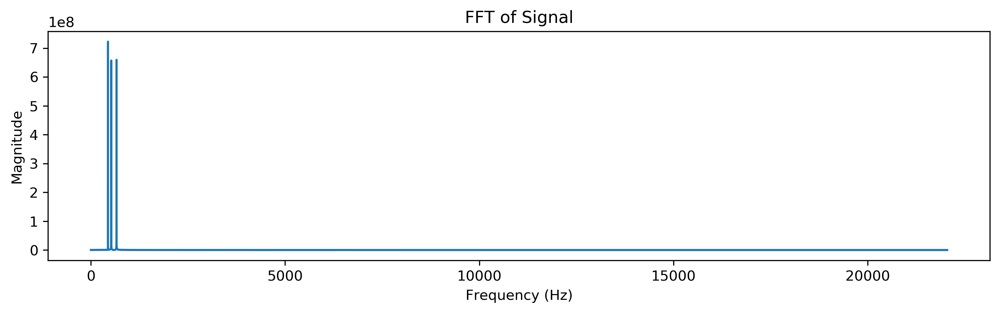

In [78]:
#plot the DFT of A and A-minor
A.export("A.wav",True)
r,samples = wavfile.read('A.wav')
A1 = SoundWave(r,samples)
A1.plot(True)
A_minor1.plot(True)


### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

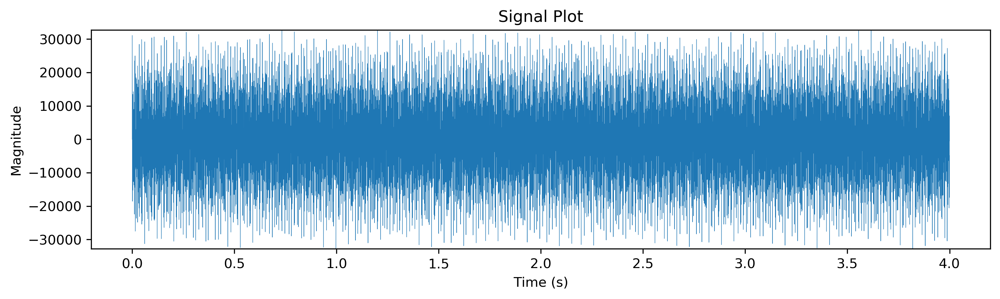

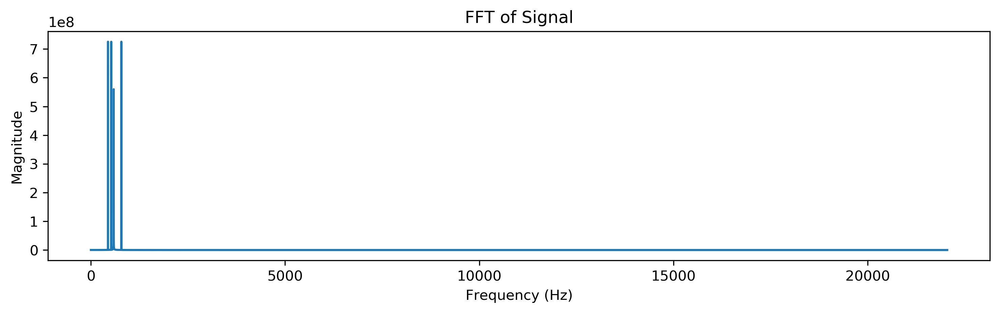

Frequency  440.0 : Closest Match,  A
Frequency  784.0 : Closest Match,  G
Frequency  523.25 : Closest Match,  C
Frequency  587.5 : Closest Match,  D


In [79]:
#initialize note library
notes_f = np.array([440,493.88,523.25,587.33,659.25,698.46,783.99,880])
notes = np.array(['A','B','C','D','E','F','G','A'])

#get data and plot fft and signal
r,samples = wavfile.read('mystery_chord.wav')
SoundWave(r,samples).plot(True)
frequencies = np.argsort(np.abs(fft(samples))[:len(samples)//2])[::-1][0:4]*r/len(samples)

#match observed frequencies to notes
for f in frequencies:    
    print("Frequency ",f, ": Closest Match, ", notes[np.argmin(np.abs(notes_f-f))])
    

The notes are...
A,G,C and D

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [80]:
#Create 2 seconds of white noise at a given rate.
rate = 22050
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
white_wav = SoundWave(rate, white_noise)

#read in tada
r,samples = wavfile.read('tada.wav')
tada = SoundWave(r,samples)

#Convolve white noise and tada
Convolution = (white_wav*tada)
(Convolution>>Convolution).export("Convolved_Tada.wav",True)
IPython.display.Audio(filename='Convolved_Tada.wav')

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [81]:
#Read CGC.wav and GCG.wav
r,samples = wavfile.read("CGC.wav")
CGC = SoundWave(r,samples)
r,samples1 = wavfile.read("GCG.wav")
GCG = SoundWave(r, samples1)

#Convolve the two
lin_conv = CGC ** GCG

#play convolution
lin_conv.export("lin_conv.wav",True)
IPython.display.Audio(filename='lin_conv.wav')

In [82]:
#Play Original GCG
IPython.display.Audio(filename='GCG.wav')

In [83]:
#Play Original CGC
IPython.display.Audio(filename='CGC.wav')

In [84]:
#Play Convolution from builtin function
conv = signal.fftconvolve(CGC.samples,GCG.samples)[:len(samples1)+len(samples)]
SoundWave(r, conv).export("built-in_conv.wav",True)
IPython.display.Audio(filename="built-in_conv.wav")

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [117]:
#read chopin.wav and play it
chopin = imprt("chopin.wav")
chopin.export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')


In [118]:
#read balloon.wav and play it
balloon = imprt("balloon.wav")
balloon.export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')


In [119]:
#convolve balloon and chopin and play them
(balloon ** chopin).export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')


### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [120]:
#Read noisy1.wav and play it
Clean1 = imprt("noisy1.wav")
Clean1.export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')

In [121]:
#clean noisy1.wav and play it
C = Clean1.clean(1250,2600)
C.export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')

In [122]:
#Read noisy1.wav and play it
Clean2 = imprt("noisy2.wav")
Clean2.export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')

In [123]:
#clean noisy2.wav and play it
Clean2.clean(1250,4350).export("stand-in.wav",True)
IPython.display.Audio(filename='stand-in.wav')

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [125]:
#read vuvuzela.wav and clean it
L,R = imprt_channel('vuvuzela.wav')
L = L.clean(200,500)
R = R.clean(200,500)

#recombine both channels and play the sound
n= np.vstack((L.samples,R.samples)).T
SoundWave(R.rate,n ).export("LR.wav",True)
IPython.display.Audio(filename='LR.wav')

In [126]:
#play original vuvuzela noise
IPython.display.Audio(filename='vuvuzela.wav')


### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

In [ ]:
#read license plate image
im = imageio.imread('license_plate.png')

#compute fft of image
im_dft = fft2(im)

#calculate mean of the image and replace peaks of noise with mean
mean = np.mean(im_dft)
im_dft[32:40,96:104]=mean
im_dft[67:75,199:207]=mean
im_dft[102:110,299:307]=mean
im_dft[178:186,329:337]=mean
im_dft[142:150,227:235]=mean
im_dft[107:115,126:134]=mean

#retrieve image with ifft
im_filt = ifft2(im_dft).real

#display original image and cleaned image
plt.imshow(im, cmap="gray")
plt.show()
plt.imshow(im_filt, cmap="gray")
plt.show()

### The year on the sticker is...2013

# Just For Fun

In [ ]:
#function to create notes given a letter and duration
def n(note,duration):
    dict = {'Ab':415.30,'A':880.00,'A#':466.16,'Bb':466.16,'B':987.77,'C':1046.50,'C#':1108.73,'D1':1174.66,'D':587.33,'D#':622.25,'E1':1318.51,'E':659.25,'F':698.46,'F1':1396.91,'Gb':739.99,'G':783.99}
    return generate_note(dict[note], duration)

#create the indiana jones tune and play it
indiana = n('E',3/8)>>n('F',1/8)>>n('G',1/4)>>n('C',5/4)>>n('D',3/8)>>n('E',1/8)>>n('F',1.5)>>n('G',3/8)>>n('A',1/8)>>n('B',1/4)>>n('F1',5/4)>>n('A',3/8)>>n('B',1/8)>>n('C',.5)>>n('D1',.5)>>n('E1',.5)
indiana.export("indi.wav",True)
IPython.display.Audio(filename="indi.wav")